In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
from scipy.signal import chirp, butter, filtfilt, correlate
from gtda.time_series import SingleTakensEmbedding, takens_embedding_optimal_parameters
from sklearn.neighbors import NearestNeighbors
from gtda.plotting import plot_point_cloud
import csv
import pandas as pd
import plotly.graph_objects as go
from nolitsa import dimension, delay
from sklearn.decomposition import PCA
import gudhi as gd
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import kmapper as km
from kmapper.jupyter import display
import umap.umap_ as umap
import sklearn
import palettable
from scipy import stats


In [2]:
# Parámetros de la señal y el ruido
sample_rate = 2048  # Hz
signal_duration = 4  # segundos
noise_duration = 1.952  # segundos
num_signals = 150  # Aumentado el número de señales
num_observations = 4000  # Número de observaciones por señal

# Generar señales de referencia
mass_ratio_min = 1.0078
mass_ratio_max = 9.9759
R_min = 0.075
R_max = 0.65

# Generar señales de referencia
mass_ratios = np.random.uniform(mass_ratio_min, mass_ratio_max, num_signals)
reference_signals = []
for mass_ratio in mass_ratios:
    time = np.linspace(0, signal_duration, int(sample_rate * signal_duration), endpoint=False)
    signal = chirp(time, f0=10, f1=100, t1=signal_duration, method='linear')
    reference_signals.append(signal)


In [3]:
# Función para insertar señal en ruido
def insert_signal_in_noise(signal, noise_duration):
    noise = np.random.normal(0, 0.5, int(sample_rate * noise_duration))  # Generar ruido
    start_time = random.uniform(0, noise_duration)  # Tiempo de inicio aleatorio dentro del ruido
    end_time = start_time + signal_duration  # Tiempo de finalización de la señal en el ruido
    full_signal = np.concatenate([noise[:int(start_time * sample_rate)], signal, noise[int(end_time * sample_rate):]])
    return full_signal, start_time


In [4]:
# Generar conjunto de entrenamiento
training_data = []
for signal in reference_signals:
    R = np.random.uniform(R_min, R_max)  # Coeficiente R aleatorio
    presence = random.random() < 0.5  # Probabilidad del 50% de presencia de la señal
    if presence:
        signal_in_noise, start_time = insert_signal_in_noise(signal, noise_duration)
        training_data.append((signal_in_noise, R, start_time))


In [5]:
# Definir las funciones para el filtrado
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y


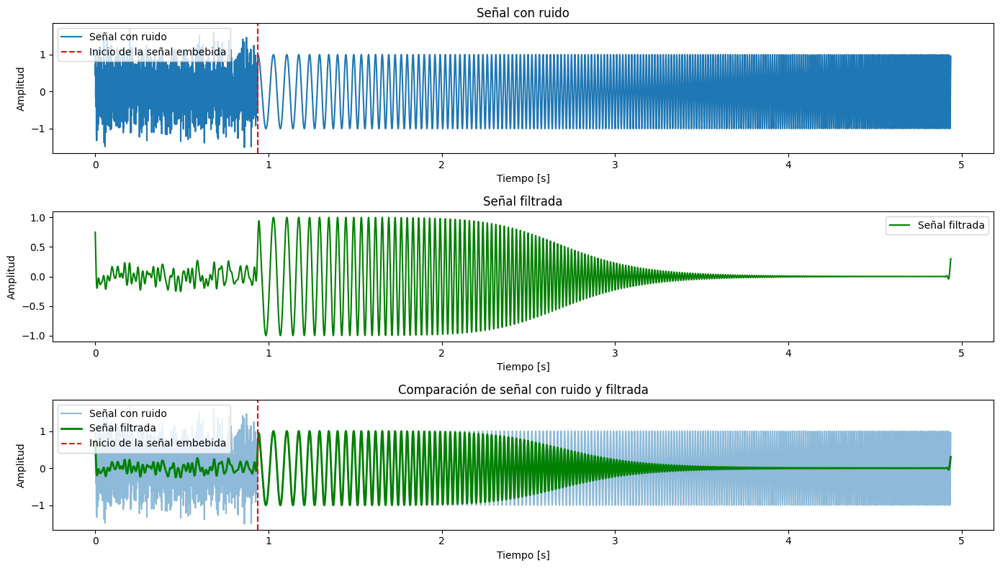

In [6]:
# Parámetros del filtro
cutoff_frequency = 50.0  # Frecuencia de corte del filtro
order = 5  # Orden del filtro

# Filtrar y visualizar una señal de ejemplo
signal_data = training_data[0][0]
R_value = training_data[0][1]
start_time = training_data[0][2]

# Tiempo para la señal
time = np.arange(0, len(signal_data)/sample_rate, 1/sample_rate)

# Filtrar la señal
filtered_signal = lowpass_filter(signal_data, cutoff_frequency, sample_rate, order)

# Graficar la señal original y filtrada
plt.figure(figsize=(14, 8))

plt.subplot(3, 1, 1)
plt.plot(time, signal_data, label='Señal con ruido')
plt.axvline(start_time, color='red', linestyle='--', label='Inicio de la señal embebida')
plt.title('Señal con ruido')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(time, filtered_signal, label='Señal filtrada', color='green')
plt.title('Señal filtrada')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(time, signal_data, label='Señal con ruido', alpha=0.5)
plt.plot(time, filtered_signal, label='Señal filtrada', color='green', linewidth=2)
plt.axvline(start_time, color='red', linestyle='--', label='Inicio de la señal embebida')
plt.title('Comparación de señal con ruido y filtrada')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.legend()

plt.tight_layout()
plt.show()


In [7]:
# Ajustar num_signals_to_process a la longitud de training_data
num_signals_to_process = min(100, len(training_data))  # Número de señales a procesar

# Parámetros del filtro
cutoff_frequency = 50.0  # Frecuencia de corte del filtro
order = 5  # Orden del filtro

# Seleccionar y filtrar múltiples señales
filtered_signals = []

for i in range(num_signals_to_process):
    signal_data = training_data[i][0]  # Usar la señal i del conjunto de datos
    if i > 0 and np.array_equal(signal_data, filtered_signals[-1]):  # Verificar si la señal es idéntica a la anterior
        print(f"La señal {i+1} es idéntica a la señal {i}. Saltando...")
        continue
    filtered_signal = lowpass_filter(signal_data, cutoff_frequency, sample_rate, order)
    filtered_signals.append(filtered_signal)


In [8]:
# Asegurar que todas las señales tengan la misma longitud
fixed_length_signals = []
for signal in filtered_signals:
    if len(signal) > num_observations:
        fixed_signal = signal[:num_observations]  # Truncar la señal
    else:
        fixed_signal = np.pad(signal, (0, num_observations - len(signal)), 'constant')  # Rellenar con ceros
    fixed_length_signals.append(fixed_signal)

# Encontrar parámetros óptimos para Takens embedding
opt_delay, opt_dimension = takens_embedding_optimal_parameters(fixed_length_signals[0], max_time_delay=10, max_dimension=10)

# Encajar las señales filtradas
embedded_signals = []
embedder = SingleTakensEmbedding(
    parameters_type="search",
    n_jobs=-1,  # Usar todos los núcleos disponibles
    time_delay=opt_delay,
    dimension=2,
    stride=3
)

for filtered_signal in fixed_length_signals:
    embedded_signal = embedder.fit_transform(filtered_signal.reshape(-1, 1))
    embedded_signals.append(embedded_signal)


In [9]:
# Crear la columna de tiempo
time = np.linspace(0, signal_duration, num_observations, endpoint=False)

# Crear un diccionario para construir el DataFrame
data = {'time': time}
for i, signal in enumerate(fixed_length_signals):
    data[f'signal_{i+1}'] = signal

# Crear el DataFrame
df = pd.DataFrame(data)

# Mostrar el DataFrame
df.head()

# Escribir el DataFrame en un archivo CSV
df.to_csv('señales.csv', index=False)

# Confirmar que se ha guardado correctamente
print("El DataFrame se ha guardado como 'señales.csv'")


El DataFrame se ha guardado como 'señales.csv'


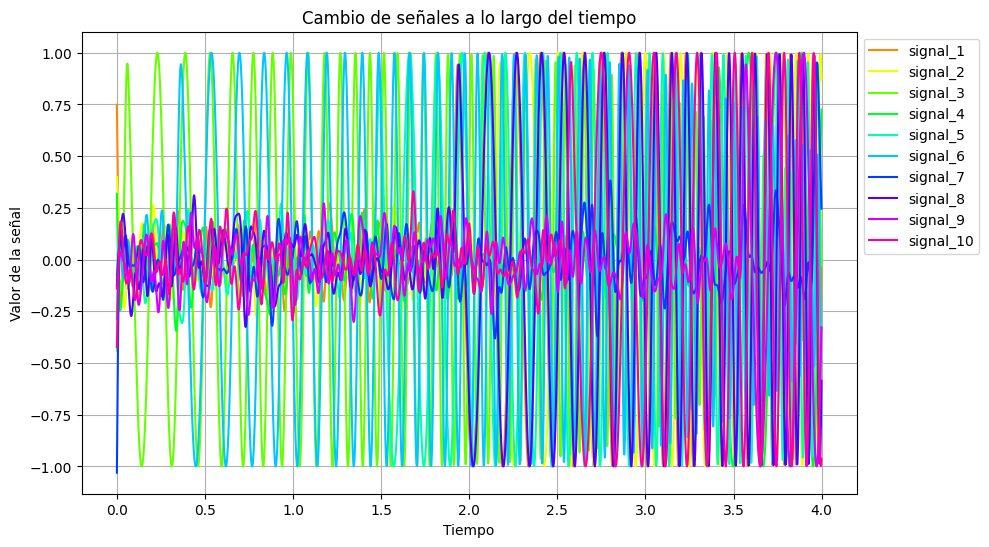

In [10]:
# Crear una gráfica para mostrar el cambio de temperatura para cada mes a lo largo de todos los años
plt.figure(figsize=(10, 6))

# Conjunto para almacenar etiquetas únicas
used_labels = set()

# Definir una paleta de colores categóricos
palette = sns.color_palette("hsv", 10)

# Iterar sobre las columnas de señales y graficarlas
for i, col in enumerate(df.columns[1:11]):
    plt.plot(df['time'], df[col], label=col, color=palette[i])

# Configurar etiquetas y título
plt.xlabel('Tiempo')
plt.ylabel('Valor de la señal')
plt.title('Cambio de señales a lo largo del tiempo')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)

plt.show()


In [11]:
# Extrae la variación de temperatura y el tiempo
temperatura = df.iloc[:, 1:].values.flatten()
print(temperatura)
#temperatura2 = df.iloc[1:60,1:].values.flatten()
tiempo = df["time"]

# Crea la figura
fig = go.Figure()

# Añade el gráfico de dispersión
fig.add_trace(go.Scatter(
    x=tiempo, 
    y=temperatura, 
    mode='markers', 
    marker=dict(size=3),
    name=col
))

# Configura el diseño de la figura
fig.update_layout(
    title='señales a lo largo del tiempo',
    xaxis=dict(title='tiempo'),
    yaxis=dict(title='Variación')
)

# Muestra la figura
fig.show()


[ 0.74820815  0.39887618 -0.44041458 ... -0.95120615  0.63513802
  0.68311757]


In [ ]:
from sklearn.decomposition import PCA

# Aplicar PCA para reducir la dimensionalidad a 2
pca = PCA(n_components=2)
embedded_signals_pca = [pca.fit_transform(signal) for signal in embedded_signals]

# Graficar los puntos encajados en el espacio PCA
for i, embedded_signal_pca in enumerate(embedded_signals_pca):
    fig = plot_point_cloud(embedded_signal_pca)
    fig.update_layout(title=f'Puntos encajados de la señal {i+1} en espacio PCA')
    fig.show()


# Análisis estadístico 

In [19]:
import numpy as np
import pandas as pd

# Número de señales y observaciones
num_signals = 100
num_observations = 4000
signal_duration = 4  # segundos

# Crear la columna de tiempo
time = np.linspace(0, signal_duration, num_observations, endpoint=False)

# Crear un diccionario para construir el DataFrame
data = {'time': time}

for i, signal in enumerate(embedded_signals[:num_signals]):
    # Verificar si la señal tiene la longitud correcta
    signal_flattened = signal.flatten()
    if len(signal_flattened) > num_observations:
        signal_flattened = signal_flattened[:num_observations]  # Truncar si es más larga
    elif len(signal_flattened) < num_observations:
        signal_flattened = np.pad(signal_flattened, (0, num_observations - len(signal_flattened)), 'constant')  # Rellenar con ceros si es más corta
    data[f'signal_{i+1}'] = signal_flattened

# Crear el DataFrame
df2 = pd.DataFrame(data)

# Guardar el DataFrame en un archivo CSV si es necesario
df2.to_csv('embedded_signals.csv', index=False)
print("El DataFrame se ha guardado como 'embedded_signals.csv'")


El DataFrame se ha guardado como 'embedded_signals.csv'


In [20]:
# Mostrar las primeras filas del DataFrame
df2.head()

,time,signal_1,signal_2,signal_3,signal_4,signal_5,signal_6,signal_7,signal_8,signal_9,...,signal_56,signal_57,signal_58,signal_59,signal_60,signal_61,signal_62,signal_63,signal_64,signal_65
0,0.000,0.605086,0.372834,-0.357182,0.212248,-0.028589,-0.200996,-0.826219,-0.081995,-0.115272,...,0.020912,-0.741555,0.189660,-0.053827,0.603350,-0.388125,-0.032848,-0.371858,-0.125001,0.207831
1,0.001,-0.020502,0.210504,-0.108113,-0.171554,0.105370,0.076477,-0.036038,0.053957,-0.001865,...,0.109333,-0.014679,0.017920,-0.112238,0.127442,0.048831,-0.004026,-0.208353,-0.021218,-0.043574
2,0.002,0.389701,0.326480,-0.248583,0.066870,0.027631,-0.085009,-0.533435,-0.029156,-0.077940,...,0.049510,-0.479398,0.119006,-0.091794,0.437814,-0.237330,-0.016184,-0.323897,-0.093527,0.117411
3,0.003,-0.125978,0.163140,-0.098864,-0.222403,0.113138,0.093249,0.070607,0.080215,0.019340,...,0.128350,0.102429,0.000726,-0.095027,0.046892,0.125110,-0.000816,-0.162023,0.004210,-0.079237
4,0.004,0.190915,0.276467,-0.167153,-0.054995,0.071085,0.005008,-0.280603,0.012046,-0.042027,...,0.077563,-0.249736,0.064423,-0.112343,0.286915,-0.098991,-0.007937,-0.273378,-0.060879,0.036989


# Análisis descriptivo

In [21]:
# Resumen estadístico
descriptive_stats = df2.describe()
print(descriptive_stats)


              time     signal_1     signal_2     signal_3     signal_4  \
count  4000.000000  4000.000000  4000.000000  4000.000000  4000.000000   
mean      1.999500    -0.000742     0.002019    -0.000308    -0.003494   
std       1.154845     0.420062     0.394902     0.517428     0.232284   
min       0.000000    -0.999901    -0.999969    -0.999969    -1.000098   
25%       0.999750    -0.076035    -0.048128    -0.298676    -0.031066   
50%       1.999500     0.000000     0.000000     0.000000     0.000000   
75%       2.999250     0.078040     0.062871     0.309843     0.032731   
max       3.999000     0.999996     0.999977     0.999997     0.999991   

          signal_5     signal_6     signal_7     signal_8     signal_9  ...  \
count  4000.000000  4000.000000  4000.000000  4000.000000  4000.000000  ...   
mean      0.001184     0.001369    -0.000276    -0.000482    -0.007803  ...   
std       0.457903     0.513944     0.110598     0.419500     0.208501  ...   
min      -1.00046

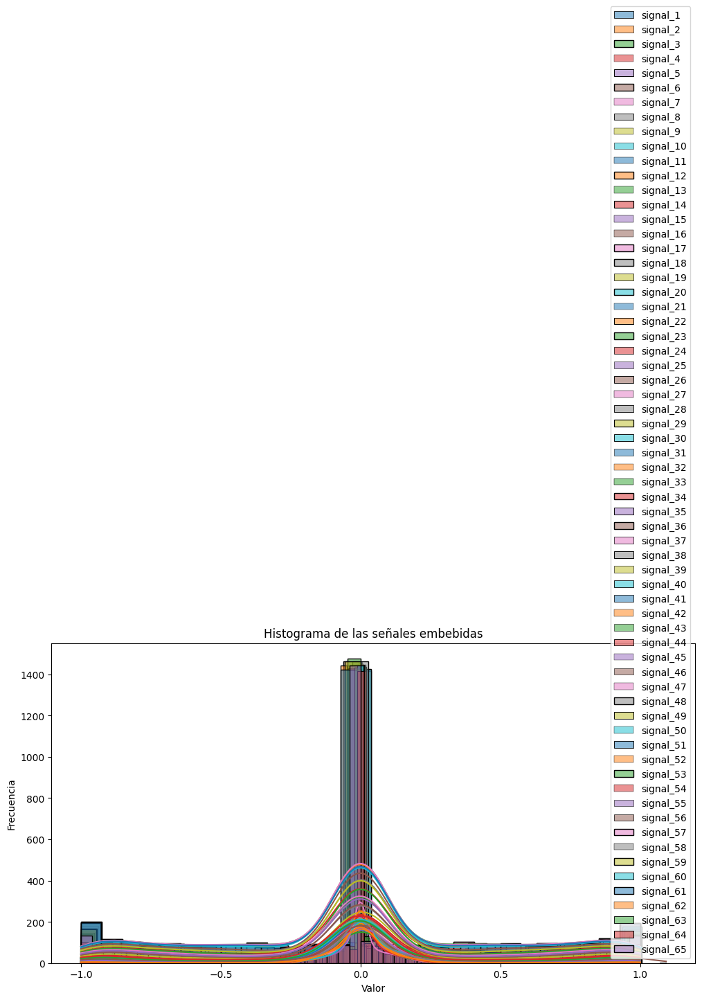

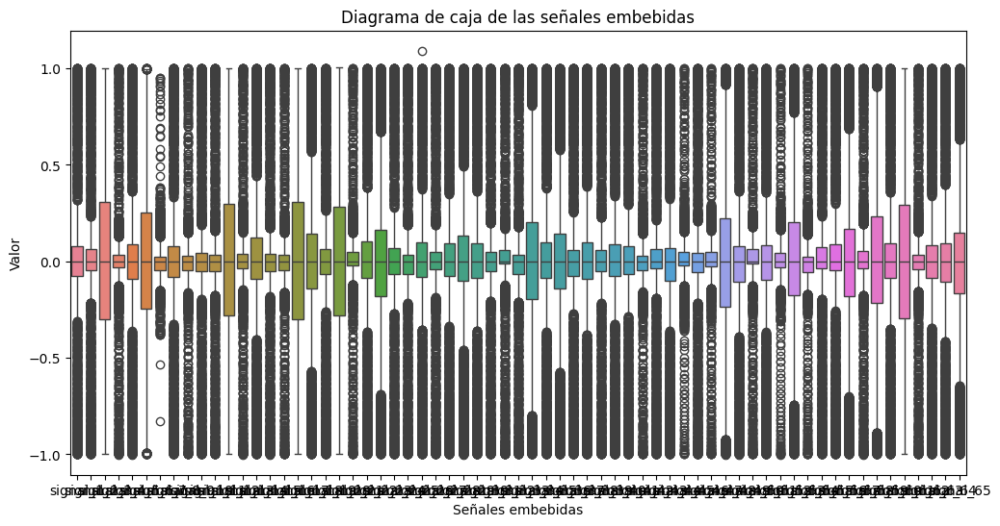

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Histograma
plt.figure(figsize=(12, 6))
for column in df2.columns[1:]:
    sns.histplot(df2[column], kde=True, label=column)
plt.title('Histograma de las señales embebidas')
plt.xlabel('Valor')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

# Diagrama de caja
plt.figure(figsize=(12, 6))
sns.boxplot(data=df2.iloc[:, 1:])
plt.title('Diagrama de caja de las señales embebidas')
plt.xlabel('Señales embebidas')
plt.ylabel('Valor')
plt.show()


# Análisis Exploratorio

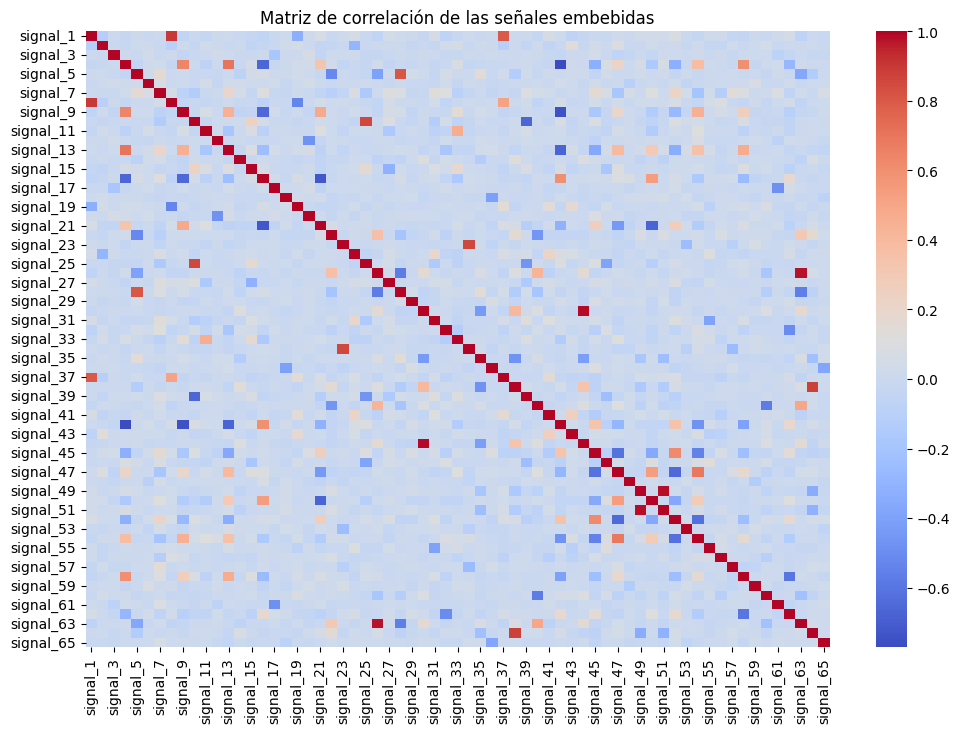

In [24]:
# Matriz de correlación
correlation_matrix = df2.iloc[:, 1:].corr()

# Mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Matriz de correlación de las señales embebidas')
plt.show()


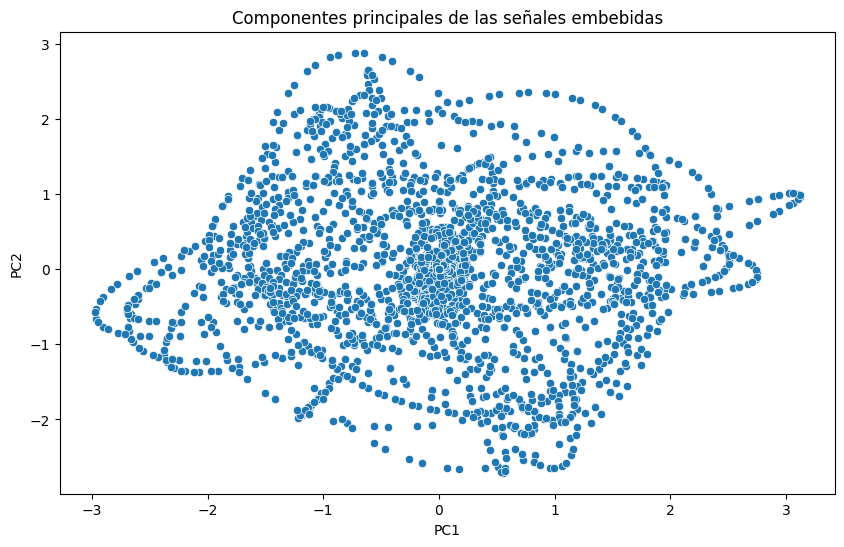

In [25]:
from sklearn.decomposition import PCA

# Aplicar PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df2.iloc[:, 1:])

# DataFrame con los componentes principales
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Visualización
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('Componentes principales de las señales embebidas')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


# Análisis Predictivo

c:\Users\ivana\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



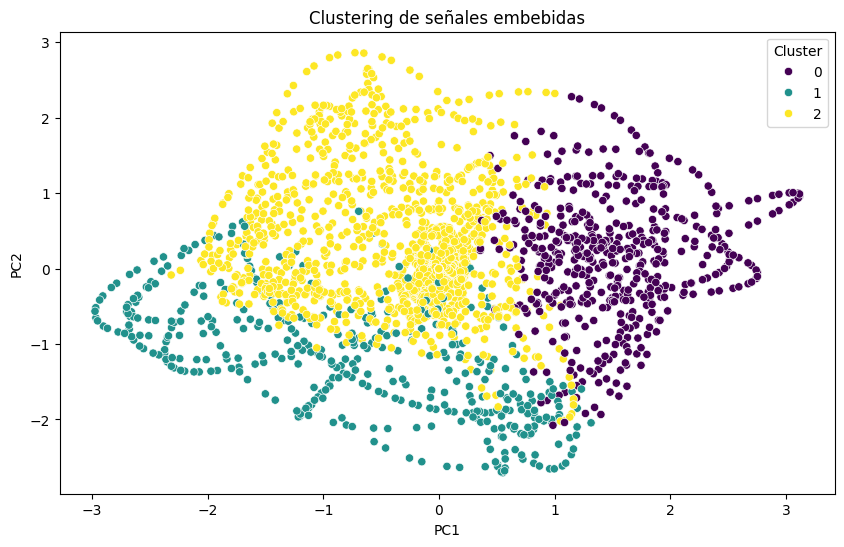

In [28]:
from sklearn.cluster import KMeans

# Aplicar KMeans
kmeans = KMeans(n_clusters=3)  # Puedes ajustar el número de clusters
clusters = kmeans.fit_predict(df2.iloc[:, 1:])

# Añadir clusters al DataFrame de PCA
pca_df['Cluster'] = clusters

# Visualización de clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='viridis')
plt.title('Clustering de señales embebidas')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


# Análisis Inferencial

In [30]:
from scipy.stats import f_oneway

# Extraer grupos
groups = [df2.iloc[:, 1:][clusters == i] for i in range(3)]  # Ajustar según el número de clusters

# ANOVA
f_stat, p_value = f_oneway(*groups)
print(f'Estadístico F: {f_stat}')
print(f'Valor p: {p_value}')


Estadístico F: [2.64238257e+01 2.95269456e+00 1.88323655e+01 3.30721240e+00
 4.25532799e+02 4.75668876e+00 7.85023941e+00 1.47147203e+01
 6.54359078e+00 1.87330846e+00 8.21392129e-03 3.11798507e+01
 1.42826584e+00 1.08888459e+01 1.95670215e+00 3.60670657e+00
 1.81135074e+01 7.54117068e+00 8.79340592e-02 3.34229254e+01
 4.28415682e+00 2.16920050e+02 6.48666517e-01 2.46849440e+00
 4.11133949e+00 6.53569412e+02 2.19992192e-01 6.32094690e+02
 1.14771398e+01 7.55746691e+02 7.85666506e-01 1.64579847e+00
 9.46347926e-01 9.04961746e-01 3.63232469e+02 6.44086506e+00
 3.16072372e+01 1.63318636e+03 3.13668087e+00 3.11177121e+01
 6.24299555e+00 6.17470650e-01 3.57981258e+00 6.40511567e+02
 3.80706575e+00 7.88862706e-01 8.35108516e+00 6.51183999e-01
 4.09242416e+02 2.51259146e+00 3.73747976e+02 9.43508527e+00
 1.13817427e+00 5.67877609e+00 9.97680870e-02 6.56668680e+00
 2.87654130e+00 2.67499457e+00 2.11299494e+00 2.75053977e+00
 8.60397817e+00 6.70379853e-01 5.83113681e+02 7.89715777e+02
 1.793298

# Análisis predictivo con RANDOMFOREST

In [34]:
# Crear etiquetas aleatorias para la clasificación (0 o 1)
np.random.seed(42)
labels = np.random.randint(0, 2, size=num_observations)
df2['label'] = labels


In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Separar características y etiquetas
X = df2.iloc[:, 1:-1]  # Todas las columnas de señales
y = df2['label']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo
rf_model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Reporte de clasificación
print(classification_report(y_test, y_pred))

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de confusión:")
print(conf_matrix)


              precision    recall  f1-score   support

           0       0.52      0.35      0.42       425
           1       0.46      0.64      0.54       375

    accuracy                           0.48       800
   macro avg       0.49      0.49      0.48       800
weighted avg       0.50      0.48      0.47       800

Matriz de confusión:
[[149 276]
 [136 239]]


In [43]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from scipy.signal import chirp, butter, filtfilt

# Funciones necesarias
def insert_signal_in_noise(signal, noise_duration, snr_db):
    noise = np.random.normal(0, 1, len(signal))
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    snr_linear = 10 ** (snr_db / 10)
    noise_variance = signal_power / (snr_linear * noise_power)
    scaled_noise = noise * np.sqrt(noise_variance)
    signal_in_noise = signal + scaled_noise
    return signal_in_noise

def lowpass_filter(signal, cutoff_freq, sample_rate, order=5):
    nyquist = 0.5 * sample_rate
    normal_cutoff = cutoff_freq / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, signal)
    return y

# Generar nuevas señales
num_new_signals = 50
new_reference_signals = []
sample_rate = 1000  # 1000 muestras por segundo
signal_duration = 4  # 4 segundos
mass_ratio_min, mass_ratio_max = 0.5, 1.5

for _ in range(num_new_signals):
    mass_ratio = np.random.uniform(mass_ratio_min, mass_ratio_max)
    time = np.linspace(0, signal_duration, int(sample_rate * signal_duration), endpoint=False)
    signal = chirp(time, f0=10, f1=100, t1=signal_duration, method='linear')
    new_reference_signals.append(signal)

# Insertar las nuevas señales en ruido y filtrar
snr_db = 10  # relación señal-ruido
cutoff_frequency = 50  # frecuencia de corte para el filtro
new_training_data = []

for signal in new_reference_signals:
    signal_in_noise = insert_signal_in_noise(signal, signal_duration, snr_db)
    new_training_data.append(signal_in_noise)

new_filtered_signals = []

for signal in new_training_data:
    filtered_signal = lowpass_filter(signal, cutoff_frequency, sample_rate)
    new_filtered_signals.append(filtered_signal)

# Asegurar que todas las señales nuevas tengan la misma longitud
new_fixed_length_signals = []

for signal in new_filtered_signals:
    if len(signal) > sample_rate * signal_duration:
        fixed_signal = signal[:int(sample_rate * signal_duration)]  # Truncar la señal
    else:
        fixed_signal = np.pad(signal, (0, int(sample_rate * signal_duration) - len(signal)), 'constant')  # Rellenar con ceros
    new_fixed_length_signals.append(fixed_signal)

# Crear DataFrame para las nuevas señales
new_time = np.linspace(0, signal_duration, int(sample_rate * signal_duration), endpoint=False)
new_data = {'time': new_time}

for i, signal in enumerate(new_fixed_length_signals):
    signal_flattened = signal.flatten()
    if len(signal_flattened) > len(new_time):
        signal_flattened = signal_flattened[:len(new_time)]
    elif len(signal_flattened) < len(new_time):
        signal_flattened = np.pad(signal_flattened, (0, len(new_time) - len(signal_flattened)), 'constant')
    new_data[f'signal_{i+1}'] = signal_flattened

new_df = pd.DataFrame(new_data)

# Asignar etiquetas aleatorias a las nuevas señales
np.random.seed(42)
new_labels = np.random.randint(0, 2, size=num_new_signals)

# Agregar las etiquetas al DataFrame replicándolas para cada punto de la señal
for i in range(num_new_signals):
    new_df[f'label_{i+1}'] = new_labels[i]


# Predicción con las nuevas señales
X_new = new_df.iloc[:, 1:]  # Omitir la columna de tiempo

# División del conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(new_df.iloc[:, 1:-num_new_signals], new_df.iloc[:, -num_new_signals:], test_size=0.2, random_state=42)

# Entrenamiento del modelo Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = rf_model.predict(X_test)
print(classification_report(y_test.values.flatten(), y_pred.flatten()))

# Matriz de confusión
conf_matrix = confusion_matrix(y_test.values.flatten(), y_pred.flatten())
print("Matriz de confusión:")
print(conf_matrix)

# Reordenar las columnas de X_new para que coincidan con el orden y los nombres de las características utilizadas durante el entrenamiento
X_new_reordered = X_new[new_df.columns[1:-num_new_signals]]

# Predicción con las nuevas señales
new_predictions = rf_model.predict(X_new_reordered)
print("Predicciones para las nuevas señales:")
print(new_predictions)




              precision    recall  f1-score   support

           0       1.00      1.00      1.00     18400
           1       1.00      1.00      1.00     21600

    accuracy                           1.00     40000
   macro avg       1.00      1.00      1.00     40000
weighted avg       1.00      1.00      1.00     40000

Matriz de confusión:
[[18400     0]
 [    0 21600]]
Predicciones para las nuevas señales:
[[0 1 0 ... 0 1 1]
 [0 1 0 ... 0 1 1]
 [0 1 0 ... 0 1 1]
 ...
 [0 1 0 ... 0 1 1]
 [0 1 0 ... 0 1 1]
 [0 1 0 ... 0 1 1]]
